In [3]:
import os
import glob
import numpy as np
import skimage.color
import matplotlib.pyplot as plt
import scipy.ndimage as nd
import scipy.interpolate as inter
from scipy import ndimage
import cv2 
from tqdm import tqdm_notebook

# Display Sample Images from Segmentation Network

In [7]:
# Load Images
path = r'C:\Users\WINDOWS 10 PRO\Documents\BMC\Semester 2\PMSD\Scripts\MaskMetrics'
os.chdir(path)
imgs = []
for file in glob.glob("*.png"):
    images = plt.imread(file)
    imgs.append(images)

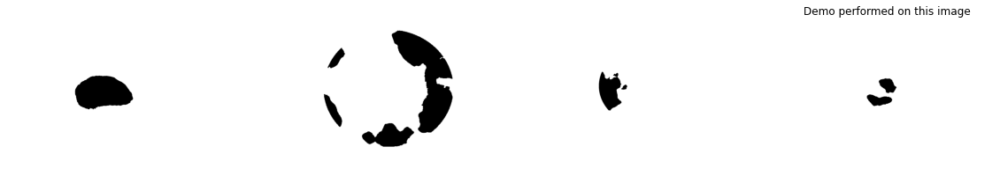

In [8]:
fig, ((plot1, plot2,plot3,plot4)) = plt.subplots(1, 4, figsize=(20,10))
plot1.imshow(imgs[0], cmap=plt.cm.gray)
plot1.axis('off')
plot2.imshow(imgs[2], cmap=plt.cm.gray)
plot2.axis('off')
plot3.imshow(imgs[3], cmap=plt.cm.gray)
plot3.axis('off')
plot4.imshow(imgs[1], cmap=plt.cm.gray)
plot4.axis('off')
plt.title('Demo performed on this image')
plt.show()

# Capture Contours & Export Geometry to .json 
#### Explore The Example With Test Image 3 [4 Segments]

In [9]:
sample = 1

Number of fragments:  2


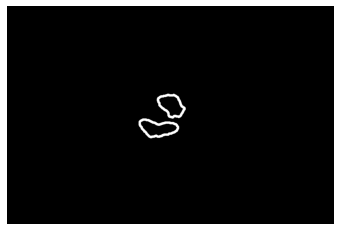

In [10]:
image = imgs[sample].astype(np.uint8)
_,binary = cv2.threshold(image, 0, 1, cv2.THRESH_BINARY_INV)
contours, hierarchy = cv2.findContours(binary, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
print('Number of fragments: ',len(contours))
outline = cv2.drawContours(binary, contours, -1, (255, 255, 255), 18)
plt.imshow(outline, cmap = 'gray')
plt.axis('off')
plt.show()

In [11]:
import skimage
from skimage import measure
from skimage.measure import find_contours
import json

image = imgs[sample]

def geo2json(contours,sample):

    anno = {'lineColor': [0,255,0,128],
           'shapes': [{}],
           }

    for n, c in enumerate(contours):

        contour = c.squeeze()
        segmentation = contour.tolist()

        anno['shapes'][0]['points_'+str(n)] = segmentation


    file = "image" + str(sample) + ".json"
    with open(file, 'w') as outfile:
        json.dump(anno, outfile,indent = 1)
        
    return anno

In [12]:
anno = geo2json(contours,sample)

In [13]:
coordinates = []
for shapes in anno['shapes'][0]:
    print(shapes)
    coordinates.append(anno['shapes'][0][shapes])

points_0
points_1


In [14]:
height,width = image.shape[0],image.shape[1]

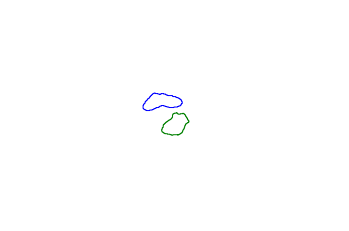

In [15]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon

fig,ax = plt.subplots()
ax.set_xlim([0,width])
ax.set_ylim([0,height])

'''
b : blue.
g : green.
r : red.
c : cyan.
m : magenta.
y : yellow.
k : black.
w : white.
'''


colors='bgrcmykwbrgc'
for p, c in zip(coordinates, colors):
    p = Polygon(p,edgecolor=c, fill = None)
    ax.add_patch(p)

plt.axis('off')
plt.show()


# Compute and Visualize Metrics

In [16]:
import math

def metrics(cnt):
    M = cv2.moments(cnt)
    #Center of mass
    cx = int(M['m10']/M['m00'])
    cy = int(M['m01']/M['m00'])
#     print('Centroid px:',cx, ',','Centroid py:',cy)

    #Area
    area = cv2.contourArea(cnt)
#     print('Area:',area)

    #Perimeter
    perimeter = cv2.arcLength(cnt,True)
#     print('Perimeter:',perimeter)

    #Circularity
    circularity = 4 * math.pi * area  / perimeter**2
#     print('Circularity:',circularity)
    
    
    text = ['Centroid px:',str(cx), ',','Centroid py:',str(cy),'\n',
                 'Perimeter:',str(perimeter),'\n',
                 'Area:',str(area),'\n',
                 'Circularity:',str(circularity),'\n']
    
    text = ' '.join(text)
    
    return text

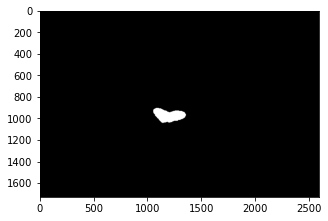

Centroid px: 1195 , Centroid py: 969 
 Perimeter: 895.0954529047012 
 Area: 27004.5 
 Circularity: 0.4235525519317175 



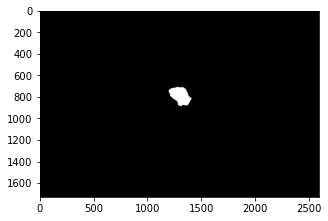

Centroid px: 1303 , Centroid py: 787 
 Perimeter: 768.2670258283615 
 Area: 24107.5 
 Circularity: 0.5132602749780151 



In [17]:
shapes = []
for c in contours:
    x,y,w,h = cv2.boundingRect(c)
    mask2 = np.zeros(image.shape, dtype=np.uint8)
    cv2.fillPoly(mask2, [c], [255,255,255])
    shapes.append(mask2)
    
    plt.figure(figsize = (5,5))
    plt.imshow(mask2 ,cmap = 'gray')
    plt.pause(0.05)
    text = metrics(c)
    print(text)

Angle of Rotation:  -82.7249984741211
Angle of Rotation:  -40.81508255004883


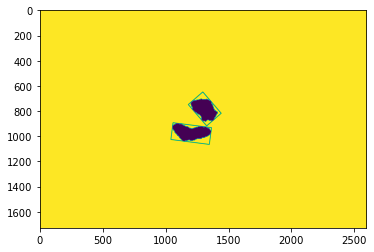

In [18]:
#Capture Bounding Boxes For Each Segmentation
for c in contours:
    cnt = c
#     x,y,w,h = cv2.boundingRect(cnt)
#     ree = cv2.rectangle(image,(x,y),(x+w,y+h),(0,255,0),2)
    rect = cv2.minAreaRect(cnt)
    print('Angle of Rotation: ',rect[2])
    box = cv2.boxPoints(rect)
    box = np.int0(box)
    bound = cv2.drawContours(image,[box],0,(0,0,255),2)
    plt.imshow(bound)


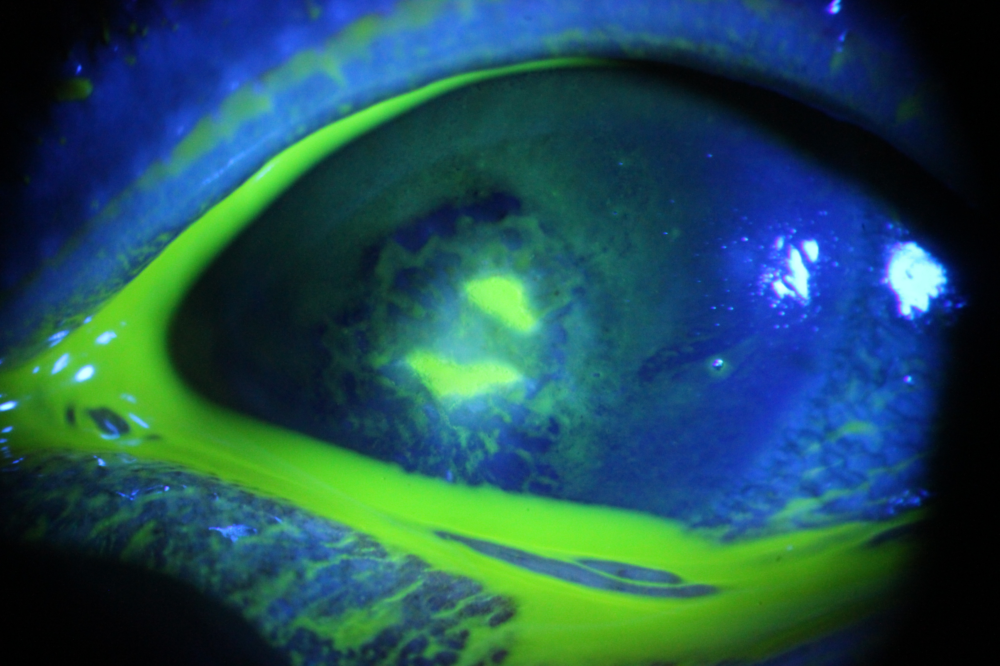

(None,)

In [19]:
import plotly.graph_objects as go
from skimage import data
from PIL import Image

# pyImage = '384_raw.jpg'
pyImage = Image.open('364.jpg')
# pyImage = Image.fromarray(image)

text = metrics(c)
# Create figure
fig = go.Figure()

# Constants
img_width = width
img_height = height
scale_factor = 0.35


#Add all annotations
for c, coords in zip(contours,coordinates):
    text = metrics(c)
    x_cord = []
    y_cord = []
    for x, y in coords:
        x_cord = np.append(x_cord,x)
        y_cord = np.append(y_cord,y)
    y_cord = (height-1)-y_cord
    fig.add_trace(go.Scatter(x=x_cord*0.35, y=y_cord*0.35, fill='toself',
#                        line_color="DarkOrange",
                         text= text))
    

# Configure axes
fig.update_xaxes(
    visible=False,
    range=[0, img_width * scale_factor]
)

fig.update_yaxes(
    visible=False,
    range=[0, img_height * scale_factor],
    # the scaleanchor attribute ensures that the aspect ratio stays constant
    scaleanchor="x"
)


# Add image
fig.add_layout_image(
    dict(
        x=0,
        sizex=img_width * scale_factor,
        y=img_height * scale_factor,
        sizey=img_height * scale_factor,
        xref="x",
        yref="y",
        opacity=0.7,
        layer="below",
        sizing="stretch",
        source=pyImage)
)


fig.update_layout(dragmode='drawclosedpath',
    width=img_width * scale_factor,
    height=img_height * scale_factor,
    margin={"l": 0, "r": 0, "t": 0, "b": 0},
                 )

# fig.show(config={'doubleClick': 'reset'})

fig.show(config={'modeBarButtonsToAdd':['drawline',
                                        'drawopenpath',
                                        'drawclosedpath',
                                        'drawcircle',
                                        'drawrect',
                                        'eraseshape'
                                       ],
                 'doubleClick': 'reset'}),


# Disable the autosize on double click because it adds unwanted margins around the image
# More detail: https://plotly.com/python/configuration-options/


# Measurement Tools & Modify Preliminary Segmentations In Dash Browser

In [20]:
reference = 78 #recorded pixel measurements from slit calibration

In [21]:
import plotly.graph_objects as go # or plotly.express as px
from PIL import Image

# pyImage = '384_raw.jpg'
pyImage = Image.open('364.jpg')

text = metrics(c)
# Create figure
fig = go.Figure()

# Constants
img_width = width
img_height = height
scale_factor = 0.35


#Add all annotations
for c, coords in zip(contours,coordinates):
    text = metrics(c)
    x_cord = []
    y_cord = []
    for x, y in coords:
        x_cord = np.append(x_cord,x)
        y_cord = np.append(y_cord,y)
    y_cord = (height-1)-y_cord
    fig.add_trace(go.Scatter(x=x_cord*0.35, y=y_cord*0.35, fill='toself',
#                        line_color="DarkOrange",
                         text= text))
    

# Configure axes
fig.update_xaxes(
    visible=False,
    range=[0, img_width * scale_factor]
)

fig.update_yaxes(
    visible=False,
    range=[0, img_height * scale_factor],
    # the scaleanchor attribute ensures that the aspect ratio stays constant
    scaleanchor="x"
)


# Add image
fig.add_layout_image(
    dict(
        x=0,
        sizex=img_width * scale_factor,
        y=img_height * scale_factor,
        sizey=img_height * scale_factor,
        xref="x",
        yref="y",
        opacity=0.7,
        layer="below",
        sizing="stretch",
        source=pyImage)
)


fig.update_layout(
    width=img_width * scale_factor,
    height=img_height * scale_factor,
    margin={"l": 0, "r": 0, "t": 0, "b": 0},
                 )

fig.update_layout(
    legend=dict(
        x=0,
        y=.5,
        traceorder="normal",
        font=dict(
            family="sans-serif",
            size=12,
            color="black"
        ),
    )
)
import dash
from dash import dcc
from dash import html
from dash.dependencies import Input, Output

# Build App
app = dash.Dash(__name__)
app.layout = html.Div(
    [
    html.H4("Welcome! Use the line tool or polygon tool to measure regions of interest"),
        dcc.Graph(
            id='graph',
            figure=fig,
            config={'modeBarButtonsToAdd':['drawline','drawclosedpath','eraseshape']}),
        html.Pre(id='content', children='Select Line or ClosedPath Tool \n')
        ])

# app.layout.clickmode = 'event+select'

@app.callback(
    dash.dependencies.Output('content', 'children'),
    [dash.dependencies.Input('graph', 'relayoutData')],
#     [dash.dependencies.Input("graph-pic", "relayoutData")],
    [dash.dependencies.State('content', 'children')])


def shape_added(fig_data, content):
    if fig_data is None:
        return dash.no_update
    if 'shapes' in fig_data:
        line = fig_data['shapes'][-1]
        if line['type'] == 'line':
            length = math.sqrt((line['x1'] - line['x0']) ** 2 +
                               (line['y1'] - line['y0']) ** 2)
            length = length/reference
            content += 'Length of line (mm) \n' + '%.1f'%length + '\n'
        if line['type'] == 'path':
            length = line['path']
            content = 'Shape Path (SVG) \n' + length + '\n'
        
    return content



if __name__ == "__main__":
    app.run_server(debug=True, use_reloader=False, port = 8046)


Dash is running on http://127.0.0.1:8046/

 * Serving Flask app "__main__" (lazy loading)
 * Environment: production
   Use a production WSGI server instead.
 * Debug mode: on


In [ ]:
print(fig)

In [ ]:
fig.write_json('test.json')